# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [1]:
# %pip install --user matplotlib

In [2]:
import pandas as pd
import numpy as np
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

<center>

### Это я сдаю свою домашку на 3 балла:
<img src="https://i.pinimg.com/564x/ef/ce/fa/efcefa78296109467a6b1576c89d5a58.jpg" width="400"> 
</center>

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

__Мой черновик для этого пункта (сохраняю, чтобы потом иметь возможность уловить свой ход мысли)__

In [3]:
matrix = np.array([
    [1, 2, 3],
    [4, 5, 6],
    [7, 8, 9]
])

print(np.sum(matrix, axis=1).shape)

(3,)


In [4]:
class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components    # количество собственных векторов
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)


    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix - матрица смежности, или матрица весов
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)   # создаём новые признаки, собственные векторы Лапласиана графа
        labels = self.kmeans.fit_predict(eigenvectors)    # возвращаем полученные метки кластеров для каждой вершины графа
        return labels


    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        d = np.sum(X, axis=1)    # суммируем эдементы матрицы весов по строкам -> d_i, (n_samples,)
        D = np.diag(d)     # даигональная матрица
        L = D - X    # находим Лапласиан графа

        _, eigenvectors = np.linalg.eigh(L) # собственные векторы (n_samples, n_samples)
        eigenvectors_min = eigenvectors[:, :self.n_components] # берём только первые n_components векторов -> (n_samples, n_components)
        return eigenvectors_min


Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [5]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [6]:
data = pd.read_excel('City surface public transport stops.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [7]:
import folium

msk_map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(msk_map)
msk_map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [8]:
data.columns    # ищем, какие колонки отвечают за номера остановок и маршруты

Index(['index', 'ID_en', 'Name_en', 'Longitude_WGS84_en', 'Latitude_WGS84_en',
       'Street_en', 'AdmArea_en', 'District_en', 'RouteNumbers_en',
       'StationName_en', 'Direction_en', 'Pavilion_en', 'OperatingOrgName_en',
       'EntryState_en', 'global_id', 'geoData'],
      dtype='object')

Таким образом, за остановки отвечает 'ID_en', а за марруты - 'RouteNumbers_en'.

In [9]:
routes = data['RouteNumbers_en'].str.split(';')
all_routes = np.concatenate(routes)
uniq_routes = np.unique(all_routes)
print('Количество уникальных маршрутов: ' + str(len(uniq_routes)))

Количество уникальных маршрутов: 253


In [10]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes = data['RouteNumbers_en'].str.split(';')
    all_routes = np.concatenate(routes)
    uniq_routes = np.unique(all_routes)     # уникальные маршруты

    routes_dict = {route: [] for route in uniq_routes}

    for route in uniq_routes:
        route_stops = data[data['RouteNumbers_en'].str.contains(route)]
        unique_stops = route_stops['ID_en'].unique().tolist()
        routes_dict[route] = unique_stops
    
    return routes_dict


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    for route_ in routes.keys():
        stops_lst = routes[route_]           # извлекаем список остановок для маршрута из словаря
        route_data = data.loc[data['ID_en'].isin(stops_lst)]           # отфильтрованный по нужным остановкам датафрейм
        route_data = route_data.reset_index(drop=True)         # обновляем индексы, так как по ним позже будет сортировка остановок
        all_stops_coords = route_data[['Longitude_WGS84_en', 'Latitude_WGS84_en']].values

        all_stops_coords_with_new_axis = all_stops_coords[:, None]        # добавляем новую ось к массиву (n,2) -> (n,1,2)
        # без добавления дополнительной оси на следующем шаге получится поэлементное вычитание, когда нужно попарное

        coord_diff = all_stops_coords_with_new_axis - all_stops_coords       # вычисляем разницу в координатах между всеми парами остановок -> (n,n,2)
        coord_diff_squared = coord_diff ** 2                        # каждую разницу возводим в квадрат -> (n,n,2)
        sum_of_squares = coord_diff_squared.sum(axis=2)     # суммируем квадраты разности координат x и y -> (n,n)
        dist_matrix = np.sqrt(sum_of_squares)                       # извлекаем корень -> (n,n), матрица евклидовых расстояний

        average_distances = np.mean(dist_matrix, axis=1)        # (1,n), средние расстояния от каждой остановки до всех остальных остановок в списке
        farthest_stop_index = np.argmax(average_distances)      # индекс самой удалённой остановки

        sorted_stops_index = [farthest_stop_index]        # остановки в порядке сортировки жадным алгоритмом
        remaining_stops = list(range(len(stops_lst)))       # создаём лист из индексов списка остановок для данного маршрута
        remaining_stops.remove(farthest_stop_index)

        while remaining_stops:
            distances = dist_matrix[sorted_stops_index[-1], remaining_stops]         # расстояния между текущей остановкой и оставшимися
            closest_index = np.argmin(distances)
            closest_stop = remaining_stops[closest_index]       # ближайшая остановка маршрута к текущей

            sorted_stops_index.append(closest_stop)      # добавляем ближайшую остановку к списку 
            remaining_stops.remove(closest_stop)        # удаляем найденную ближайшую остановку из списка оставшихся


        sorted_df = route_data.iloc[sorted_stops_index]       # сортируем датафрейм по порядку индексов
        stop_numbers = sorted_df['ID_en'].tolist()          # достаём значения в отсортированном жадным алгоритмом порядке из дф
        routes[route_] = stop_numbers
        
    return routes


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    n_stops = data.shape[0]     # количество уникальных остановок
    adjacency_matrix = np.zeros((n_stops, n_stops)) 

    for route_, stops_lst in sorted_routes.items():     # по каждому маршруту из словаря отсортированных остановок
        for i in range(len(stops_lst) - 1):         # по каждой паре остановок на маршруте
            stop1 = stops_lst[i]          # -> элемент списка по инексу листа
            stop2 = stops_lst[i + 1]
            index1 = data[data['ID_en'] == stop1].index[0]      # -> индекс списка по положению в исходном датафрейме
            index2 = data[data['ID_en'] == stop2].index[0]
            adjacency_matrix[index1, index2] += 1
            adjacency_matrix[index2, index1] += 1

    return adjacency_matrix

In [11]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [12]:
msk_map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data[data['ID_en'].isin(sorted_routes[route_id])] \
            .set_index('ID_en') \
            .loc[sorted_routes[route_id], ['Latitude_WGS84_en', 'Longitude_WGS84_en']] \
            .values.tolist()

    folium.vector_layers.PolyLine(coords).add_to(msk_map)

msk_map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [13]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    msk_map = folium.Map([55.75215, 37.61819], zoom_start=12)
    uniq_labels = np.unique(labels)
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'darkred', 'darkblue', 'yellow']
    
    for label_ in uniq_labels:
        current_data = data[labels == label_]
        coords = current_data[['Latitude_WGS84_en', 'Longitude_WGS84_en']].values.tolist()

        if label_ == -1:
            for coord in coords:
                folium.CircleMarker(location=coord, radius=3, color='gray').add_to(msk_map)    

        else:
            color = colors[label_ % len(colors)]
            for coord in coords:
                folium.CircleMarker(location=coord, radius=3, color=color, fill=True, fill_color=color).add_to(msk_map)
        

    return msk_map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [14]:
from collections import Counter

kmeans_labels = KMeans(n_clusters=237, random_state=42).fit_predict(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']].values)
cluster_counts = Counter(kmeans_labels)
print(cluster_counts)

draw_clustered_map(data, kmeans_labels)

Counter({55: 12, 32: 11, 44: 11, 12: 10, 13: 10, 35: 10, 3: 10, 20: 9, 38: 9, 39: 9, 86: 9, 115: 9, 76: 9, 90: 9, 2: 9, 49: 9, 131: 8, 69: 8, 117: 8, 134: 8, 31: 8, 15: 7, 48: 7, 116: 7, 59: 7, 17: 7, 133: 7, 94: 7, 42: 7, 74: 7, 64: 7, 61: 7, 113: 7, 159: 6, 1: 6, 123: 6, 41: 6, 114: 6, 146: 6, 141: 6, 119: 6, 160: 6, 101: 6, 11: 6, 188: 6, 98: 6, 57: 6, 91: 6, 27: 6, 138: 6, 14: 6, 0: 6, 130: 6, 83: 6, 197: 6, 67: 6, 23: 6, 150: 6, 21: 5, 140: 5, 118: 5, 129: 5, 87: 5, 109: 5, 137: 5, 110: 5, 53: 5, 236: 5, 199: 5, 102: 5, 70: 5, 190: 5, 156: 5, 158: 5, 18: 5, 10: 5, 206: 5, 157: 5, 72: 5, 73: 5, 16: 5, 19: 5, 126: 5, 229: 5, 153: 5, 92: 5, 107: 5, 161: 5, 151: 5, 222: 5, 88: 5, 62: 5, 178: 5, 162: 5, 60: 5, 212: 5, 164: 4, 30: 4, 166: 4, 65: 4, 68: 4, 181: 4, 51: 4, 24: 4, 230: 4, 155: 4, 6: 4, 189: 4, 78: 4, 106: 4, 89: 4, 136: 4, 234: 4, 220: 4, 135: 4, 215: 4, 177: 4, 231: 4, 214: 4, 148: 4, 56: 4, 154: 4, 84: 4, 127: 4, 5: 4, 183: 4, 203: 4, 52: 4, 37: 4, 121: 4, 95: 4, 50: 4, 1

In [15]:
from sklearn.cluster import DBSCAN

dbscan_labels = DBSCAN(eps=0.0035).fit_predict(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']].values)
cluster_counts = Counter(dbscan_labels)
print(cluster_counts)

draw_clustered_map(data, dbscan_labels)

Counter({-1: 116, 14: 100, 21: 80, 27: 73, 25: 65, 2: 64, 16: 41, 24: 36, 7: 31, 28: 31, 19: 26, 32: 25, 4: 23, 29: 19, 9: 18, 30: 18, 18: 16, 22: 16, 1: 15, 8: 14, 12: 14, 26: 14, 3: 13, 17: 13, 31: 13, 35: 13, 23: 12, 6: 9, 15: 9, 33: 9, 37: 8, 34: 8, 20: 7, 38: 7, 39: 7, 42: 7, 0: 6, 10: 6, 11: 6, 40: 6, 13: 5, 36: 5, 41: 5, 5: 4, 43: 4})


In [16]:
spectral_labels = GraphClustering(n_clusters=237, n_components=237).fit_predict(adjacency_matrix)

cluster_counts = Counter(spectral_labels)
print(spectral_labels)

draw_clustered_map(data, spectral_labels)

[208  16   8 ... 147 209  94]


Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

_Чем отличаются разбиения на кластеры, получаемые разными алгоритмами?_ Разбиение DBSCAN очень сильно зависит от eps, находит кластеры необычной формы. Спектральная кластеризация - его полная противоположность, остановки разбиты как будто по маршрутам. KMEANS с этим random state и большим количеством кластеров немного похож на спектральную кластеризацию (но вообще ищет кластеры сферической формы).

_Какие плюсы и минусы есть у каждого алгоритма?_ Плюс __kmeans__ в эффективности на больших наборах данных, но нужно подбирать количество кластеров (непонятно, какое брать). А ещё он плохо работает с кластерами, которые имеют несферическую форму. __DBSCAN__ способен обнаруживать кластеры произвольной формы, не требует заранее заданного числа кластеров, параметр eps выглядит разумнее, чем число кластеров (жуткий минус - его очень сложно угадать, алгоритм может всё поменить шумом, например), но он медленнее kmeans и плохо работает, если в данных разная плотность. __Спектральная кластеризация__ может обнаруживать кластеры произвольной формы, работает с матрицей сходства, что может дать признаки лучше исходных, но при этом дополнительные вычисления.

_Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?_ Мне кажется, спектральная кластеризация стработала лучше всего, так как остановки расположены как будто по маршрутам.

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [17]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
print(data.shape)
data.sample(5)

(2225, 4)


,category,filename,title,content
711,entertainment,202.txt,BBC 'should allow more scrutiny',MPs have urged the BBC to give watchdogs more...
1745,sport,433.txt,Dogged Federer claims Dubai crown,World number one Roger Federer added the Duba...
1084,politics,189.txt,Blair congratulates Bush on win,Tony Blair has said he looks forward to conti...
1660,sport,348.txt,Owen set for skipper role,Wales number eight Michael Owen says replacin...
873,entertainment,364.txt,Hitch holds on to US box office,"Will Smith's first romantic comedy, Hitch, ha..."


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [18]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [19]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Настя\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Настя\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Настя\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [20]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [21]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [22]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height, random_state=42)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

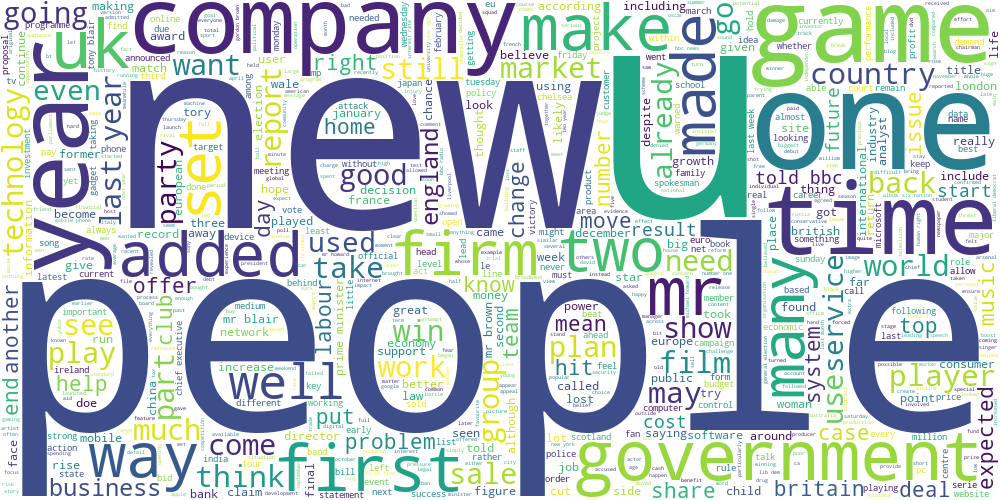

In [23]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** Неидеально, но темы получились интерпретируемыми. Предполагаемые названия тем: кинопремия, технологии, российские нефтяные компании, соревнования, экономический рост, новые компании, Лейбористская партия (выборы).

In [24]:
n_clusters=7

tfidf_vectorizer = TfidfVectorizer(min_df=5, ngram_range=(1, 1))
# min_df=5: минимальную частоту документов, в которых должно встречаться слово, чтобы оно было включено в словарь
# ngram_range=(1, 1): используем только униграмы (отдельные слова)

tfidf_matrix = tfidf_vectorizer.fit_transform(data.text)      # -> матрица (n_texts, n_uniq_words)
# каждая строка представляет tf-idf вектор документа, а каждый столбец представляет tf-idf значение для уникального слова в корпусе
# print(tfidf_matrix)

kmeans = KMeans(n_clusters, random_state=42)
kmeans.fit(tfidf_matrix)
cluster_labels = kmeans.labels_

Cluster 1:


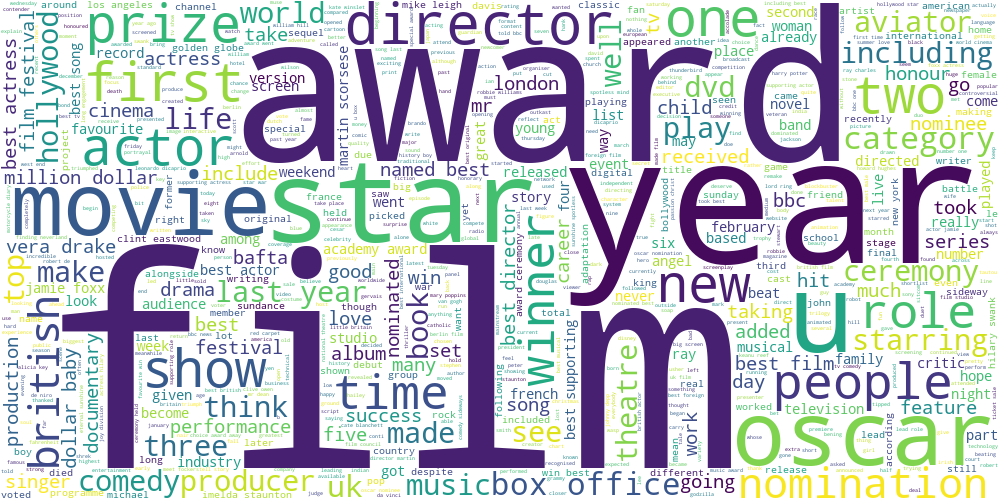

Cluster 2:


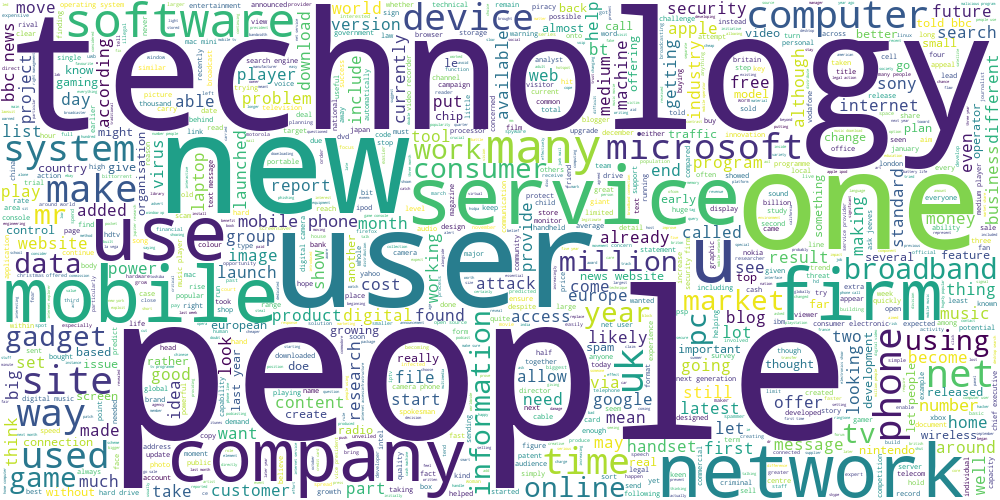

Cluster 3:


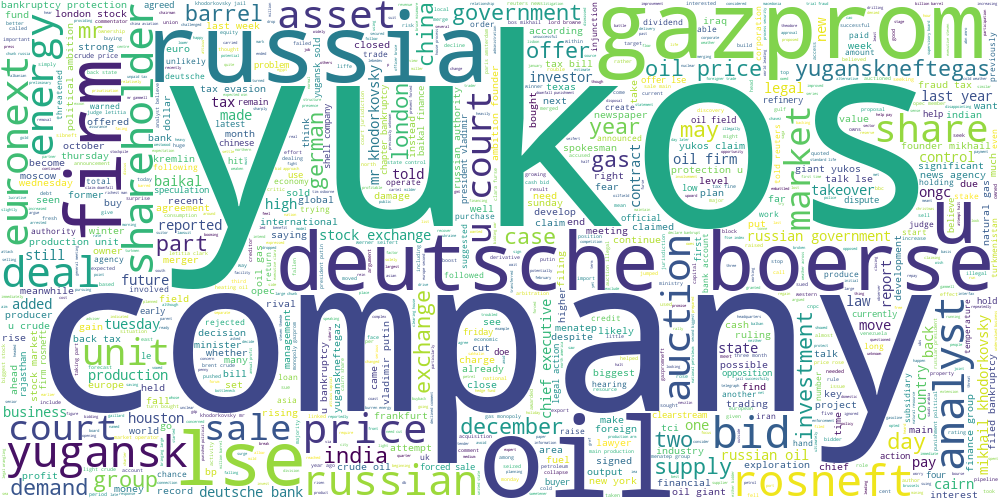

Cluster 4:


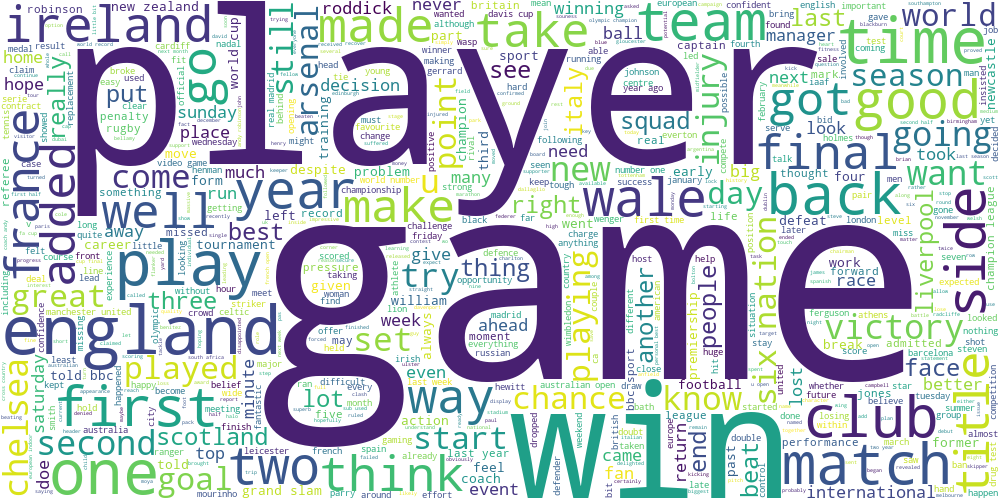

Cluster 5:


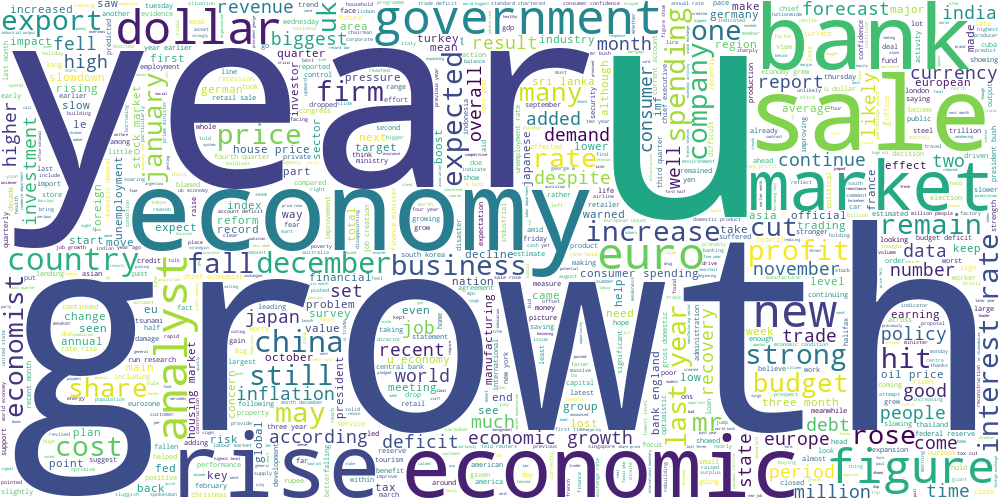

Cluster 6:


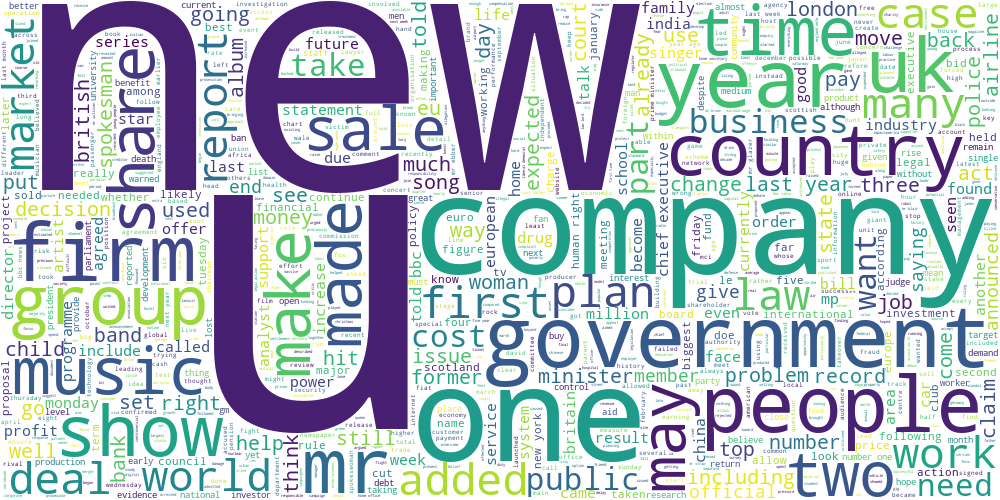

Cluster 7:


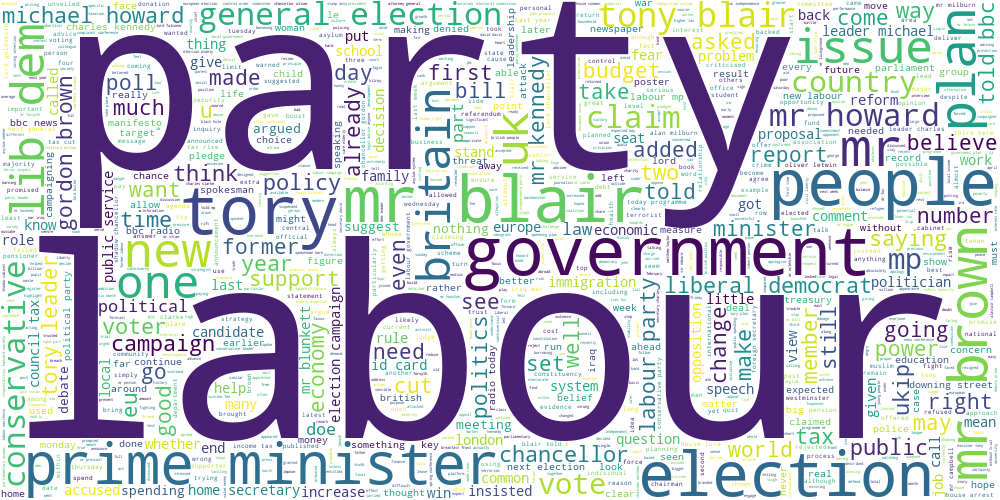

In [25]:
def draw_wordcloud_for_clusters(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height, random_state=42)
    
    wordcloud.generate(texts)
    return wordcloud.to_image()

from IPython.display import display

for cluster_num in range(n_clusters):
    cluster_texts = data.loc[cluster_labels == cluster_num, 'text']
    joint_texts = ' '.join(list(cluster_texts))
    image = draw_wordcloud_for_clusters(joint_texts)
    print(f"Cluster {cluster_num + 1}:")
    display(image)

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Да, согласаются.

In [26]:
centers_ = kmeans.cluster_centers_      # -> matrix (n_clusters, n_features)

n_top_features = 3      # choose number of popular words for comparing to worldclouds
words_indices = sorted_indices = centers_.argsort()[:, ::-1][:, :n_top_features]

feature_names = tfidf_vectorizer.get_feature_names_out()

for cluster_ in range(n_clusters):
    print(f"Cluster {cluster_ + 1}:")
    words = [feature_names[word_] for word_ in words_indices[cluster_]]
    print(", ".join(words))
    print()

Cluster 1:
film, award, best

Cluster 2:
mobile, phone, technology

Cluster 3:
yukos, oil, russian

Cluster 4:
game, player, england

Cluster 5:
growth, economy, rate

Cluster 6:
mr, company, year

Cluster 7:
mr, labour, election



**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [27]:
n_clusters = 8

tfidf_vectorizer = TfidfVectorizer(min_df=5, ngram_range=(1, 1))
tfidf_matrix = tfidf_vectorizer.fit_transform(data.text)      # -> разреженная матрица (n_texts, n_uniq_words)
# каждая строка представляет tf-idf вектор документа, а каждый столбец представляет tf-idf значение для уникального слова в корпусе

In [28]:
from sklearn.manifold import TSNE
# визуализация высокоразмерных данных в двумерное пространство 

tsne = TSNE(n_components=2, init='random', random_state=42)         # n_components: указываем размерность пространства
# init='random': чтобы на выход можно было подать разреженную матрицу, по дефолту pca

tsne_representation = tsne.fit_transform(tfidf_matrix)      # матрица размерности (n_texts, 2), так как двумерное пространство

Попробуем найти такое eps для dbscan, чтобы получилось число кластеров, которое примерно равно 8.

In [29]:
from sklearn.cluster import DBSCAN

def find_eps_range(tfidf_matrix, min_eps, max_eps, min_clusters, max_clusters):
    eps_values = np.linspace(min_eps, max_eps, num=500)
    for eps in eps_values:
        dbscan_labels = DBSCAN(eps=eps).fit_predict(tfidf_matrix)
        unique_clusters = len(np.unique(dbscan_labels))
        if min_clusters <= unique_clusters <= max_clusters:
            return eps
    return None

min_eps = 0.0001
max_eps = 10
min_clusters = 6
max_clusters = 10

eps = find_eps_range(tfidf_matrix, min_eps, max_eps, min_clusters, max_clusters)
print("Optimal eps:", eps)

Optimal eps: 0.8016951903807615


In [30]:
from sklearn.cluster import SpectralClustering

kmeans_labels = KMeans(n_clusters, random_state=42).fit_predict(tfidf_matrix)
dbscan_labels = DBSCAN(eps=eps).fit_predict(tfidf_matrix)
spectral_labels = SpectralClustering(n_clusters, random_state=42).fit_predict(tfidf_matrix)

C:\Users\Настя\AppData\Local\Temp\ipykernel_18980\2686353334.py:20: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1].scatter(xy[:, 0], xy[:, 1], c=[col], cmap='viridis', s=5)


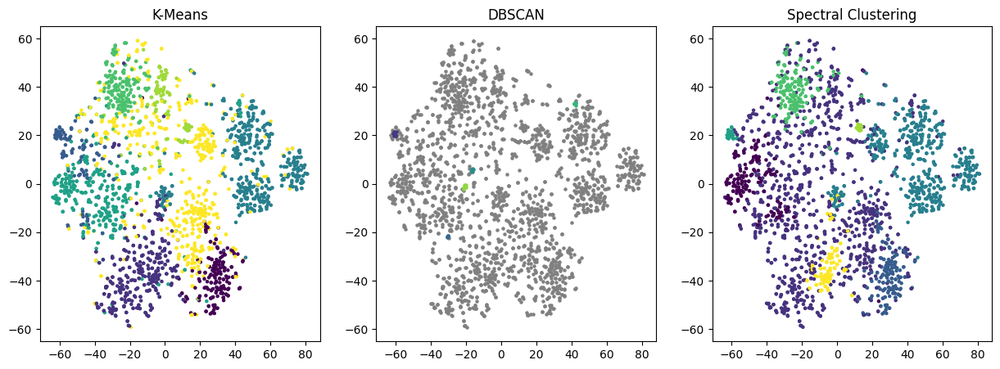

In [31]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# K-Means
axs[0].scatter(tsne_representation[:, 0], tsne_representation[:, 1], c=kmeans_labels, cmap='viridis', s=5)      # срезы, чтобы взять компоненты tsne
# c=kmeans_labels: цвет точки определяется по метке кластера из массива kmeans_labels
# cmap='viridis': цвета из цветовой карты viridis
# s=5: размер точки (по умполчанию слишком больште)
axs[0].set_title('K-Means')


# DBSCAN
unique_labels = np.unique(dbscan_labels)
colors = [plt.cm.viridis(each) for each in np.linspace(0, 1, len(unique_labels) + 1)]

for k, col in zip(unique_labels, colors):       # перебираем каждую уникальную метку кластера и соответствующий цвет
    if k == -1:         # шумовые точки рисуем серым цветом
        col = 'grey'
    class_member_mask = (dbscan_labels == k)
    xy = tsne_representation[class_member_mask]         # точки, принадлежащие текущему кластеру
    axs[1].scatter(xy[:, 0], xy[:, 1], c=[col], cmap='viridis', s=5)

axs[1].set_title('DBSCAN')


# Спектральная кластеризация
axs[2].scatter(tsne_representation[:, 0], tsne_representation[:, 1], c=spectral_labels, cmap='viridis', s=5)
axs[2].set_title('Spectral Clustering')

plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** 

_Какой баланс кластеров получился у разных методов?_ У kmeans и SpectralClustering есть дисбаланс кластеров, но не очень значительный, просто есть более большие кластеры, есть более мелкие. А в dbscan, как я параметры не подбирала, всё равно почти все объекты - шум.

_Соотносятся ли визуализации для текстов с визуализациями для географических данных?_ Я бы сказала, что не очень соотносится, так как данные совершенно разные. Ко всему прочему, результат визуализации кластеризации на геогрфических данных интерпретируем, здесь же мы можем посмотреть если только на баланс кластеров.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**  Да, темы получились более узкими. Я вывела в облаках тегов ниже самые яркие примеры на мой взгляд. Если раньше темы были достаточно общими, то послел нововведения появились специфиечские слова (названия номинаций, стран, команд, компаний и т.п.)

In [32]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
bag_of_words = count_vect.fit_transform(data['text'])       # matrix (n_texts, n_uniq_words)

In [33]:
from sklearn.decomposition import LatentDirichletAllocation

LDA = LatentDirichletAllocation(n_components=20, random_state=42)        # n_components: the number of topics
LDA.fit(bag_of_words)

LatentDirichletAllocation(n_components=20, random_state=42)

_Придумайте, как превратить распределение тем для текста в номер его кластера..._

Преобразуем мешок слов в матрицу, где будут храниться вероятности принадлежности соответствующего текста к конкретной теме, размерность (n_texts, n_topics). Выберем для каждого текста индекс темы с максимальным значением - это и будет кластер текста.

In [34]:
lda_matrix = LDA.transform(bag_of_words)        # matrix (n_texts, n_components)
# предсталяем каждый текст в пространстве тем

lda_labels = lda_matrix.argmax(axis=1)

tSNE =  TSNE(n_components=2, perplexity=15)     # воспользуемся tSNE, чтобы нормальн визуализировать
tsne_lda = tSNE.fit_transform(lda_matrix)

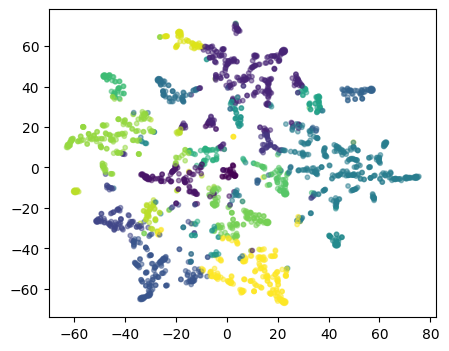

In [35]:
plt.figure(figsize=(5, 4))
plt.scatter(tsne_lda[:, 0], tsne_lda[:, 1], c=lda_labels, alpha=0.5, s=10)
plt.show()

Чтобы проанализировать темы, а не просто накидать рандомные кластеры, нужно достать слова. Вот это ниже и сделаем.

In [36]:
lda_topics_matrix = LDA.components_         # матрица (n_topics, n_uniq_words)
# распределение вероятностей слов в каждой теме

words = count_vect.get_feature_names_out()      # возвращает список уникальных слов, использованных для создания объекта CountVectorizer (начало задания 2.4)

n_top_words = 10        # количество слов, которые хотим вывести

for topic_id in range(lda_topics_matrix.shape[0]):
    topic = lda_topics_matrix[topic_id]         # распределение вероятностей слов в выбранной теме, (n_uniq_words,)

    print(f"Тема {topic_id + 1}:")

    top_words_id = topic.argsort()[::-1][:n_top_words]      # берём индексы первых n_top_words слов с самыми большвими значениями
    top_words = [words[i] for i in top_words_id]        # список из слов для данной темы
    print(" ".join(top_words))
    print("\n")

Тема 1:
number one album harry nuclear face bath tour country world


Тема 2:
film show year star also new movie game first last


Тема 3:
year company market firm share mr economy bank growth price


Тема 4:
people mr disaster tsunami aid sri world lanka country million


Тема 5:
club chelsea liverpool would virus manager league player want new


Тема 6:
win game first match two play victory final cup second


Тема 7:
yukos oil company china firm russian court russia mr government


Тема 8:
people search user would new security blog computer company work


Тема 9:
mr would labour government party election minister blair people tory


Тема 10:
drug test kenteris decision iaaf charge athens greek also information


Тема 11:
year world country also two could last month one time


Тема 12:
eu european right mr uk new foreign firm would human


Тема 13:
game child time one like title would also could xbox


Тема 14:
software microsoft car people program google tv search programme user


Те

Тема 5:


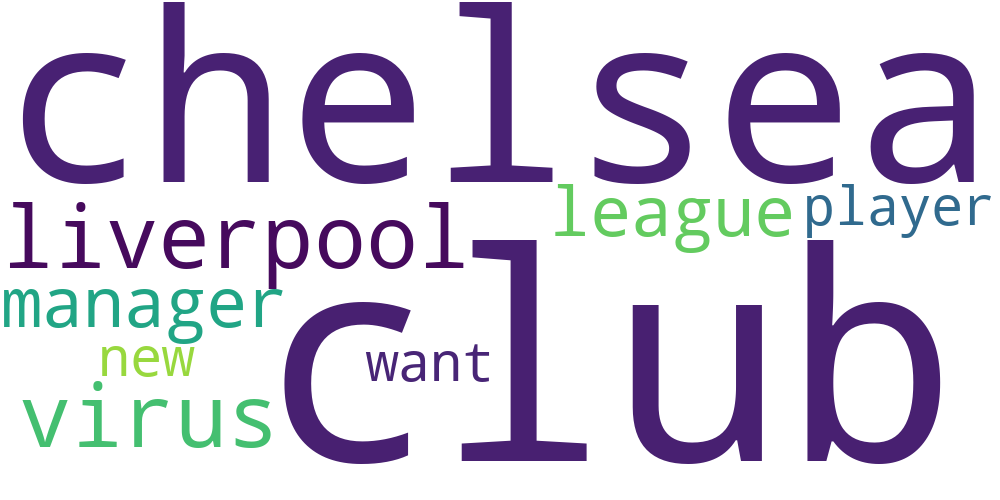

Тема 9:


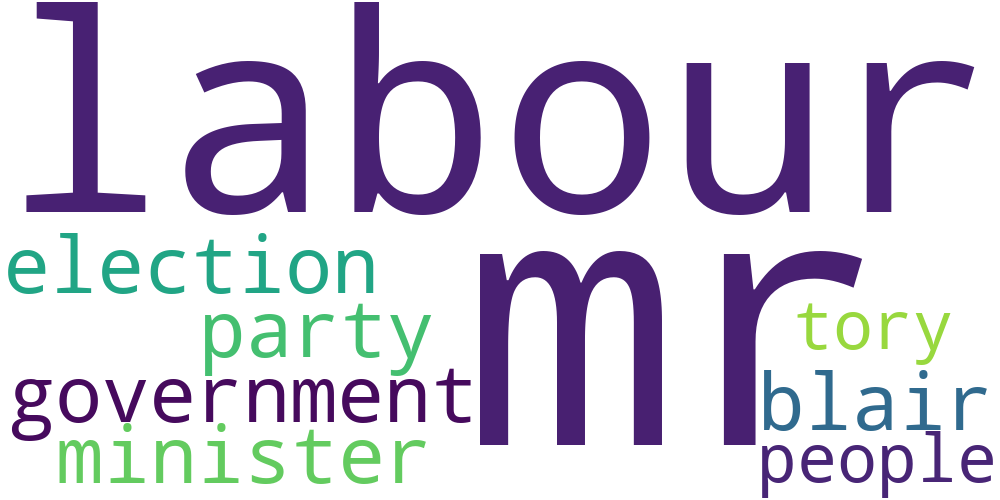

Тема 14:


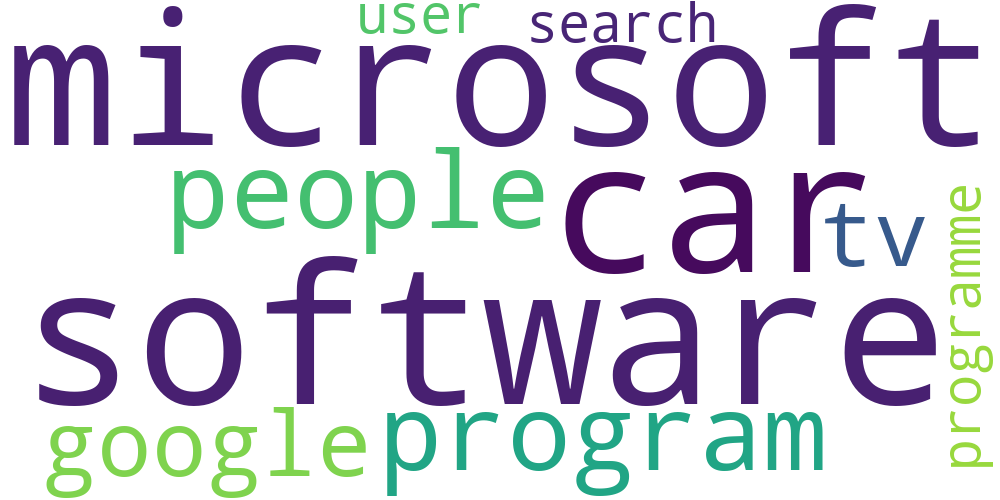

Тема 16:


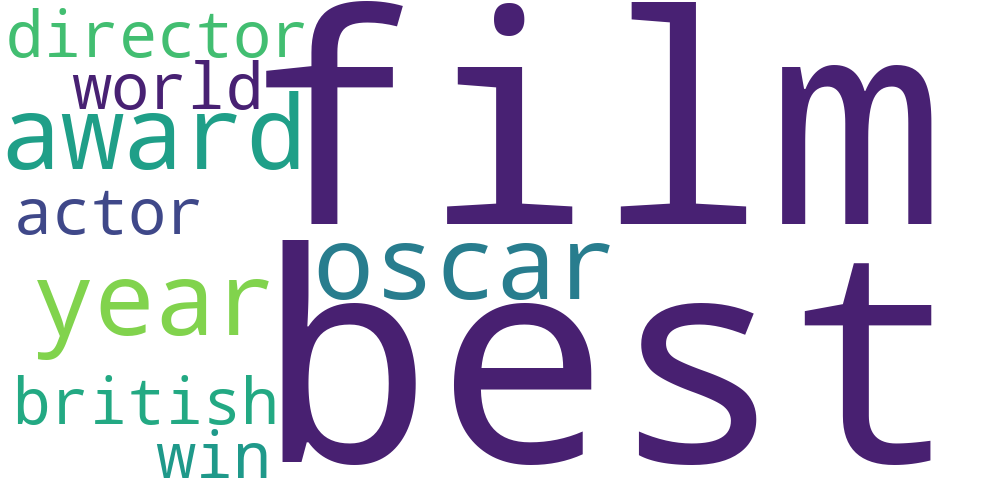

Тема 17:


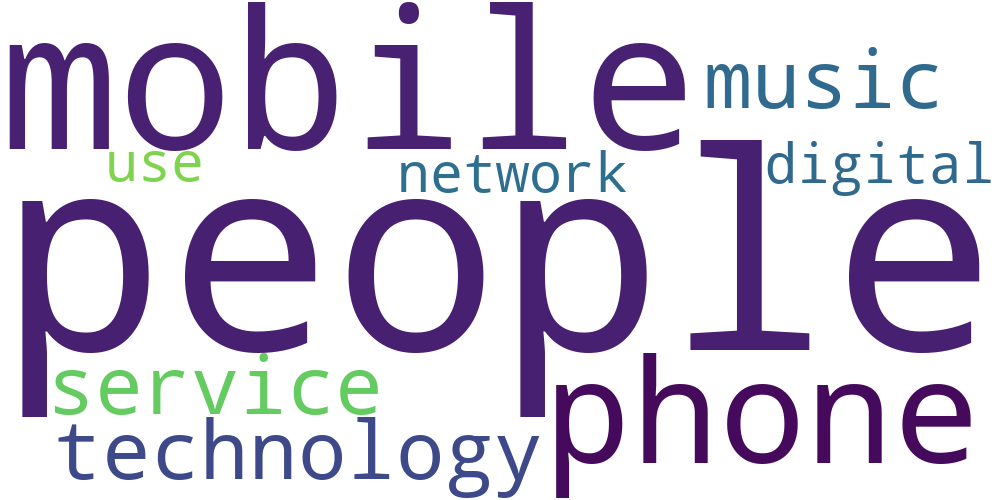

In [37]:
topics_to_display = [4, 8, 13, 15, 16]         # темы, которые хотим вывести

for topic_id in topics_to_display:
    topic = lda_topics_matrix[topic_id]

    print(f"Тема {topic_id + 1}:")

    top_words_id = topic.argsort()[:-n_top_words - 1:-1]
    top_words = [words[i] for i in top_words_id]
    top_words_text = " ".join(top_words)

    image = draw_wordcloud_for_clusters(top_words_text)
    display(image)

## Часть 3. Transfer learning для задачи классификации текстов

In [38]:
data.head()

,category,filename,title,content,raw_text,text
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...


In [39]:
data.columns

Index(['category', 'filename', 'title', 'content', 'raw_text', 'text'], dtype='object')

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

__Логистическая регрессия на tf-idf признаках__

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

tfidf_vectorizer = TfidfVectorizer(min_df=5, ngram_range=(1, 1))

X = tfidf_vectorizer.fit_transform(data.text)      # -> матрица (n_texts, n_uniq_words)
y = data['category']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy_1 = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy_1)

Accuracy: 0.9685393258426966


__K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров__

In [41]:
# выше уже создавала tf-idf матрицу, она названа X и будеи использоваться ниже
kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(X)

# cluster_centers = kmeans.cluster_centers_       # достали центры кластеров

X_distances = kmeans.transform(X)       # расстояния от каждой точки данных до каждого центроида кластера в модели kmeans.
X_train, X_test, y_train, y_test = train_test_split(X_distances, y, test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8382022471910112


__Латентное размещение Дирихле + логистическая регрессия на вероятностях тем__

In [42]:
count_vect = CountVectorizer()
bag_of_words = count_vect.fit_transform(data['text'])   

LDA = LatentDirichletAllocation(n_components=20, random_state=42)        # n_components: the number of topics
LDA.fit(bag_of_words)

X_topic_probabilities = LDA.transform(bag_of_words)        # matrix (n_texts, n_components), вероятности тем

X_train, X_test, y_train, y_test = train_test_split(X_topic_probabilities, y, test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8539325842696629


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Лучшее качество получилось у логистической регрессии на tf-idf признаках. Могу предположить, она лучше lda, так как он обучается на мешке слов, а там не учитывается idf, что может влиять на результат, и лучше kmeans, так как расстояния до центров кластеров могут не учитывать все аспекты исходных данных, всё-таки работаем с текстами.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [44]:
labeled_train, rest = train_test_split(data, test_size=0.95, random_state=42)
unlabeled_train, validation = train_test_split(rest, test_size=0.67, random_state=42)

# Выведем информацию о размерах полученных выборок
print("Размер размеченного трейна:", labeled_train.shape)
print("Размер неразмеченного трейна:", unlabeled_train.shape)
print("Размер валидационной выборки:", validation.shape)

Размер размеченного трейна: (111, 6)
Размер неразмеченного трейна: (697, 6)
Размер валидационной выборки: (1417, 6)


In [47]:
tfidf_vectorizer = TfidfVectorizer(min_df=5, ngram_range=(1, 1))

combined_text_train = list(labeled_train.text) + list(unlabeled_train.text)
tfidf_features = tfidf_vectorizer.fit_transform(combined_text_train)        # -> матрица (n_texts, n_uniq_words)

labeled_tfidf_features = tfidf_features[:len(labeled_train)]        # tf-idf признаки для размеченного трейна
unlabeled_tfidf_features = tfidf_features[len(labeled_train):]       # tf-idf признаки для неразмеченного трейна

In [48]:
from sklearn.model_selection import GridSearchCV

param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}      # подберём параметр регуляризации
classifier = LogisticRegression()
grid_search = GridSearchCV(classifier, param_grid, cv=5, scoring='accuracy')

validation_tfidf_features = tfidf_vectorizer.fit_transform(validation.text)
grid_search.fit(validation_tfidf_features, validation.category)

print("Наилучшие параметры:", grid_search.best_params_)
print("Наилучшее значение accuracy на валидации:", grid_search.best_score_)

Наилучшие параметры: {'C': 100}
Наилучшее значение accuracy на валидации: 0.971067038272035


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Сходила на книжную ярмарку non/fiction.весна. Так как выкладывала в инсту* reals на эту тему, ссылку на него как раз и прикреплю: https://www.instagram.com/reel/C5fhYzWqcsr/?igsh=NjZlaDFtdHV5aHQz

Очень понравилось, было много дешёвых книг, впервые за долгое время в загруженных буднях захотелось что-то почитать.

*признаны экстремистскими организациями и запрещены на территории РФ.